In [1]:
import torch
import matplotlib.pyplot as plt

from data_loader import RGBDDataModule

DATASET_DIR = "D:/Documents_D/processed_data"


datamodule = RGBDDataModule(
    dataset_dir=DATASET_DIR,
    batch_size=1,
    num_workers=0,
    pin_memory=False,
    img_resize=480 
)

datamodule.setup()

loader = datamodule.train_dataloader()

for i, (rgb, depth) in enumerate(loader):
    if i >= 5:
        break

    # Convert RGB from (C, H, W) to (H, W, C)
    rgb_img = rgb[0].permute(1, 2, 0).detach().cpu().numpy()

    # If values are in [-1, 1], convert to [0, 1]
    if rgb_img.min() < 0:
        rgb_img = (rgb_img + 1) / 2.0  
    rgb_img = rgb_img.clip(0, 1)

    # Depth stays grayscale
    depth_img = depth[0].squeeze().detach().cpu().numpy()
    print(depth_img)

def show_rgb_depth_pairs(dataloader, num_pairs=5):
    plt.figure(figsize=(10, 4 * num_pairs))
    
    for i, (rgb, depth) in enumerate(dataloader):
        if i >= num_pairs:
            break

        # Convert RGB from (C, H, W) to (H, W, C)
        rgb_img = rgb[0].permute(1, 2, 0).detach().cpu().numpy()

        # If values are in [-1, 1], convert to [0, 1]
        if rgb_img.min() < 0:
            rgb_img = (rgb_img + 1) / 2.0  
        rgb_img = rgb_img.clip(0, 1)

        # Depth stays grayscale
        depth_img = depth[0].squeeze().detach().cpu().numpy()
        print(depth_img)

        plt.subplot(num_pairs, 2, 2*i + 1)
        plt.imshow(rgb_img)
        plt.title(f"RGB - Pair {i}")
        plt.axis("off")

        plt.subplot(num_pairs, 2, 2*i + 2)
        plt.imshow(depth_img, cmap='gray')
        plt.title(f"Depth - Pair {i}")
        plt.axis("off")
    
    plt.tight_layout()
    plt.show()


[[0.0794 0.0794 0.0794 ... 0.2047 0.2047 0.2047]
 [0.0794 0.0794 0.0794 ... 0.2047 0.2047 0.2047]
 [0.0794 0.0794 0.0795 ... 0.2047 0.2047 0.2047]
 ...
 [0.0742 0.0742 0.0742 ... 0.2047 0.2047 0.2047]
 [0.0741 0.0741 0.0741 ... 0.2047 0.2047 0.2047]
 [0.074  0.0741 0.074  ... 0.2047 0.2047 0.2047]]
[[0.2047     0.2047     0.2047     ... 0.2047     0.2047     0.2047    ]
 [0.2047     0.09890001 0.099      ... 0.2047     0.2047     0.2047    ]
 [0.0988     0.09890001 0.099      ... 0.2047     0.2047     0.2047    ]
 ...
 [0.2047     0.2047     0.2047     ... 0.2047     0.2047     0.2047    ]
 [0.2047     0.2047     0.2047     ... 0.2047     0.2047     0.2047    ]
 [0.2047     0.2047     0.2047     ... 0.2047     0.2047     0.2047    ]]
[[0.0903 0.0905 0.0905 ... 0.2047 0.2047 0.2047]
 [0.0904 0.0905 0.0906 ... 0.2047 0.2047 0.2047]
 [0.0904 0.0905 0.0906 ... 0.2047 0.2047 0.2047]
 ...
 [0.0874 0.0875 0.0875 ... 0.2047 0.2047 0.2047]
 [0.0874 0.0874 0.0874 ... 0.2047 0.2047 0.2047]
 [0.08

[[0.0947 0.0947 0.0948 ... 0.2047 0.2047 0.2047]
 [0.0947 0.0947 0.0949 ... 0.2047 0.2047 0.2047]
 [0.0947 0.0947 0.0949 ... 0.2047 0.2047 0.2047]
 ...
 [0.0923 0.0924 0.0924 ... 0.2047 0.2047 0.2047]
 [0.0923 0.0923 0.0923 ... 0.2047 0.2047 0.2047]
 [0.0921 0.0922 0.0923 ... 0.2047 0.2047 0.2047]]
[[0.2047     0.2047     0.2047     ... 0.2047     0.2047     0.2047    ]
 [0.2047     0.2047     0.2047     ... 0.2047     0.2047     0.2047    ]
 [0.2047     0.2047     0.2047     ... 0.2047     0.2047     0.2047    ]
 ...
 [0.0693     0.0693     0.0695     ... 0.2047     0.2047     0.2047    ]
 [0.0693     0.0693     0.0695     ... 0.2047     0.2047     0.2047    ]
 [0.06919999 0.0693     0.0696     ... 0.2047     0.2047     0.2047    ]]
[[0.09100001 0.09100001 0.09100001 ... 0.2047     0.2047     0.2047    ]
 [0.09100001 0.09100001 0.09100001 ... 0.2047     0.2047     0.2047    ]
 [0.09100001 0.09100001 0.09100001 ... 0.2047     0.2047     0.2047    ]
 ...
 [0.0881     0.0881     0.0881  

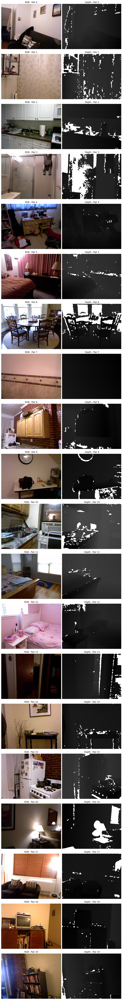

In [2]:
show_rgb_depth_pairs(loader, num_pairs=20)